In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats

# Reading the Data

In [2]:
df = pd.read_csv(r'C:\Users\hannah\Dropbox\Github_Desktop\housing_prices\Melbourne_housing_FULL.csv')

## Reordering the Columns - put 'Price' to the last

In [3]:
df=df[['Suburb', 'Address', 'Rooms', 'Type', 'Method', 'SellerG',
       'Date', 'Distance', 'Postcode', 'Bedroom2', 'Bathroom', 'Car',
       'Landsize', 'BuildingArea', 'YearBuilt', 'CouncilArea', 'Lattitude',
       'Longtitude', 'Regionname', 'Propertycount','Price']]

In [4]:
df.rename(columns={'Lattitude':'Latitude', 'Longtitude':'Longitude'}, inplace=True)

In [5]:
df.head()

,Suburb,Address,Rooms,Type,Method,SellerG,Date,Distance,Postcode,Bedroom2,...,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Latitude,Longitude,Regionname,Propertycount,Price
0,Abbotsford,68 Studley St,2,h,SS,Jellis,3/09/2016,2.5,3067.0,2.0,...,1.0,126.0,NaN,NaN,Yarra City Council,-37.8014,144.9958,Northern Metropolitan,4019.0,NaN
1,Abbotsford,85 Turner St,2,h,S,Biggin,3/12/2016,2.5,3067.0,2.0,...,1.0,202.0,NaN,NaN,Yarra City Council,-37.7996,144.9984,Northern Metropolitan,4019.0,1480000.0
2,Abbotsford,25 Bloomburg St,2,h,S,Biggin,4/02/2016,2.5,3067.0,2.0,...,0.0,156.0,79.0,1900.0,Yarra City Council,-37.8079,144.9934,Northern Metropolitan,4019.0,1035000.0
3,Abbotsford,18/659 Victoria St,3,u,VB,Rounds,4/02/2016,2.5,3067.0,3.0,...,1.0,0.0,NaN,NaN,Yarra City Council,-37.8114,145.0116,Northern Metropolitan,4019.0,NaN
4,Abbotsford,5 Charles St,3,h,SP,Biggin,4/03/2017,2.5,3067.0,3.0,...,0.0,134.0,150.0,1900.0,Yarra City Council,-37.8093,144.9944,Northern Metropolitan,4019.0,1465000.0


In [6]:
# total rows and columns
df.shape

(34857, 21)

In [7]:
# show the list of the columns in the data
df.columns.to_list()

['Suburb',
 'Address',
 'Rooms',
 'Type',
 'Method',
 'SellerG',
 'Date',
 'Distance',
 'Postcode',
 'Bedroom2',
 'Bathroom',
 'Car',
 'Landsize',
 'BuildingArea',
 'YearBuilt',
 'CouncilArea',
 'Latitude',
 'Longitude',
 'Regionname',
 'Propertycount',
 'Price']

# Data Pre-Processing

## Missing Values

In [8]:
df.isnull().sum()

Suburb               0
Address              0
Rooms                0
Type                 0
Method               0
SellerG              0
Date                 0
Distance             1
Postcode             1
Bedroom2          8217
Bathroom          8226
Car               8728
Landsize         11810
BuildingArea     21115
YearBuilt        19306
CouncilArea          3
Latitude          7976
Longitude         7976
Regionname           3
Propertycount        3
Price             7610
dtype: int64

The function **isnull().sum()** gives us the information of how many missing values we have for each column. The missing values for **Bedroom2, Bathroom, Car, Landsize, BuildingArea, YearBuilt, Latitude, Longitude,** and **Price** seem to be a lot, and **Distance, Postcode, CouncilArea, Regionname,** and **Propertycount** have few missing values.

However, it's not easy to know the overall shape and structure of the missing values only by looking at this information. In order to see the ratio and pattern of missing values, we can use **missingno** library in Python.

In [9]:
import missingno as msno

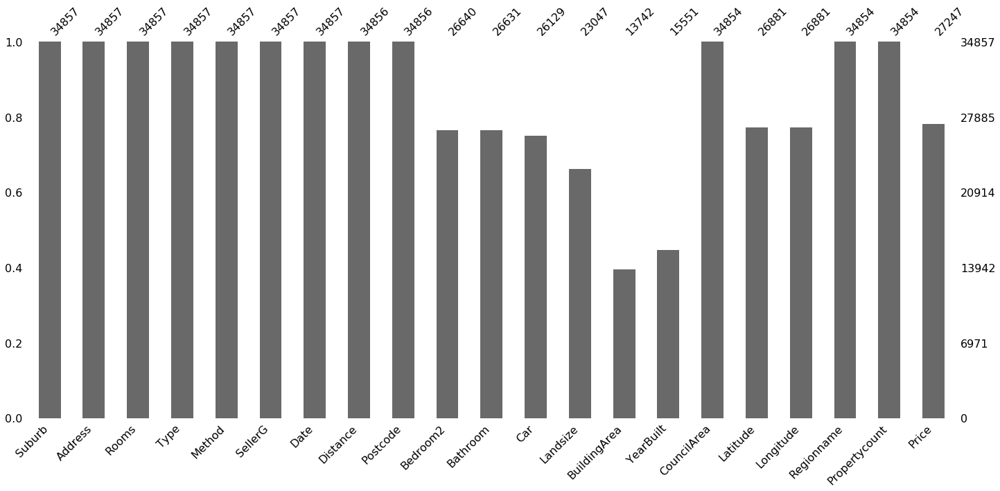

In [10]:
# show the number of missing values using visualization
msno.bar(df)

This graph contains a couple of information about missing values. 

The numbers at the left of the graph represent the ratio of the non-missing values. The numbers at the top of the graph are the number of the non-missing values for each column. The ratios of the missing values in **Bedroom2, Bathroom, Car, Latitude, Longitude,** and **Price** are about 20~25% of the whole entries. 

However, the ratio goes up to about 50~60% for **BuildingArea** and **Yearbuilt**. The missing values in **Landsize** are about 30%.

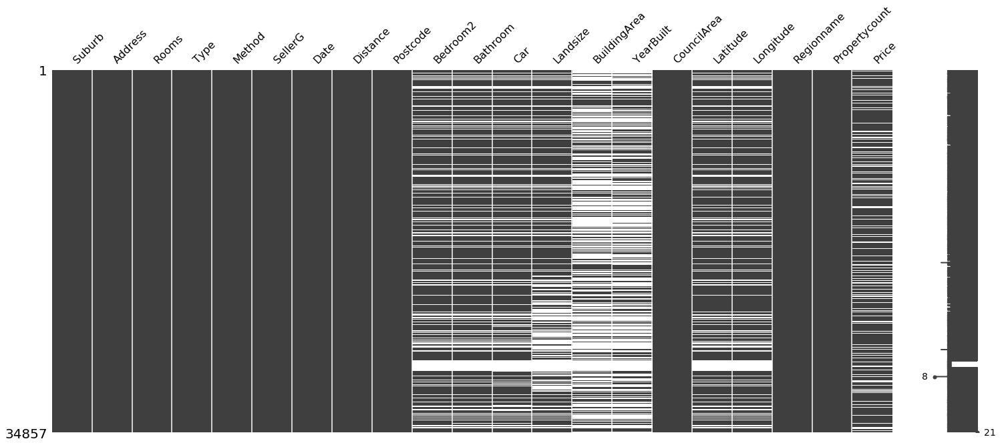

In [11]:
# the pattern of missing values 
msno.matrix(df)

The matrix above shows the patterns and relationships of missing values among the features. 

**Bedroom2, Bathroom, Car, Latitude,** and **Longitude** appear to have almost the same pattern. The missing values in these features seem to be deeply correlated to **Landsize** as well. Furthermore, **BuildingArea** and **YearBuilt** also have similar patterns with each other.

### Correlation between features

(13, 0)

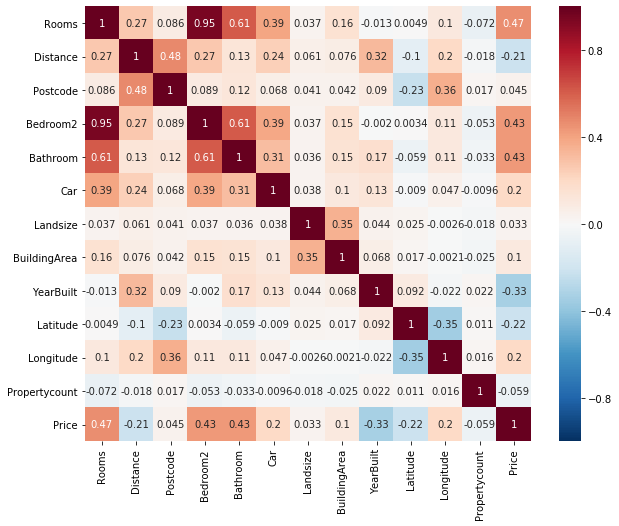

In [12]:
plt.figure(figsize=(10,8))
ax=sns.heatmap(df.corr(), cmap='RdBu_r',annot=True, vmin=-1, vmax=1)
ax.set_ylim(13,0)

### Bedroom2

**Bedroom2** has 8,217 missing values. In the data, we have **Rooms** which has no missing values and contains overlapped information about houses. 

In [13]:
coef,p_val = stats.pearsonr(df[df['Bedroom2'].notnull()]['Bedroom2'],df[df['Bedroom2'].notnull()]['Rooms'])
print('The correlation coefficient between Bedroom2 and Rooms:',coef)

The correlation coefficient between Bedroom2 and Rooms: 0.9467546231299308


The correlation coefficient between **Bedroom2** and **Rooms** is 0.9468. Since the correlation between these two features is extremely strong, including them in the same regressions can cause the collinearity problem. 

Therefore, instead of replacing the missing values in **Bedroom2** for alternative values, I drop the feature out of the data.

In [14]:
df.drop(['Bedroom2'], axis=1, inplace=True)

### Bathroom

**Bathroom** has 8,226 missing values. In most cases, the more rooms a house has, the more bathrooms it will also have. This means that this feature is also expected to be strongly correlated to **Rooms** as well.

In [15]:
coef,p_val = stats.pearsonr(df[df['Bathroom'].notnull()]['Bathroom'],df[df['Bathroom'].notnull()]['Rooms'])
print('The correlation coefficient between Bathroom and Rooms:', coef)

The correlation coefficient between Bathroom and Rooms: 0.6118258594417147


The correlation coefficient between **Bathroom** and **Rooms** is 0.6118. The coefficient is not as high as the case for **Bedroom2**. However, this magnitude of the coefficient is not negligible in terms of the collinearity issue. 

In order to see if this feature has collinearity with Rooms, I check the **Variance Inflation Factor (VIF)**.

In [16]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from patsy import dmatrices

y, X = dmatrices('Price ~ Rooms + Bathroom + Car', df, return_type = 'dataframe')
vif = pd.DataFrame()
vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["features"] = X.columns
vif

,VIF,features
0,11.851791,Intercept
1,1.718915,Rooms
2,1.600451,Bathroom
3,1.194295,Car


For the **VIF** test, **Car** is also added in addition to **Bathroom** and **Rooms**. If the **VIF** of features are greater than 5, those features can be considered having the collinearity problem. 

In the table above, **Bathroom** and **Rooms** do not seem to have this issue even though the correlation appears to be strong. Furthermore, the distribution of this feature is quite simple so it will be easy to find alternative values for missing values.

Text(0.5, 1.0, 'Distribution of Bathroom')

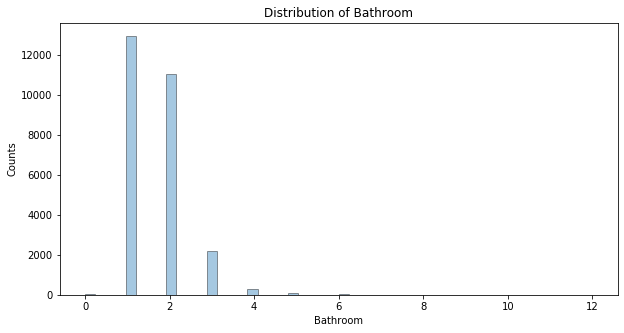

In [17]:
plt.figure(figsize=(10,5))
sns.distplot(df[df['Bathroom'].notnull()].Bathroom, hist=True, kde=False, hist_kws={'edgecolor':'black'})
plt.ylabel('Counts')
plt.title('Distribution of Bathroom')

The distribution of **Bathroom** is quite simple. Most of the houses have one or two bathrooms. It is highly possible that most of the houses with missing values in **Bathroom** have one or two bathrooms as well. 

The strategy of replacing missing values is to use **Rooms** which is a good predictor for **Bathroom**. I make a categorical feature from **Rooms**, which indicates whether the level of **Rooms** for a house is high, medium, or low. 

For a group of houses with the same level of **Rooms**, I find the median of **Bathroom**. Then, for each group of houses with the same level of **Rooms**, the medians will be put for the missing values in **Bathroom**.

In [18]:
df['Rooms'].value_counts()

3     15084
2      8332
4      7956
5      1737
1      1479
6       204
7        32
8        19
10        6
9         4
12        3
16        1
Name: Rooms, dtype: int64

In [19]:
df['Rooms2'] = None
df.loc[(df['Rooms']<3), 'Rooms2'] = 'low'
df.loc[(df['Rooms']>=3)&(df['Rooms']<6), 'Rooms2'] = 'medium'
df.loc[(df['Rooms']>=6), 'Rooms2'] = 'high'

bath_low = df[df['Rooms2']=='low'].Bathroom.median()
bath_medium = df[df['Rooms2']=='medium'].Bathroom.median()
bath_high = df[df['Rooms2']=='high'].Bathroom.median()

df.loc[df['Rooms2']=='low', 'Bathroom'] = df.loc[df['Rooms2']=='low', 'Bathroom'].fillna(bath_low)
df.loc[df['Rooms2']=='medium', 'Bathroom'] = df.loc[df['Rooms2']=='medium', 'Bathroom'].fillna(bath_medium)
df.loc[df['Rooms2']=='high', 'Bathroom'] = df.loc[df['Rooms2']=='high', 'Bathroom'].fillna(bath_high)

### Car (# of carspot)

**Car** denotes the number of car spots for a house. Like **Bathroom**, this feature also has the possibility of having collinearity with **Rooms**. According to the VIF test, this feature appears not to have collinearity with **Rooms**.

Text(0.5, 1.0, 'Distribution of Car')

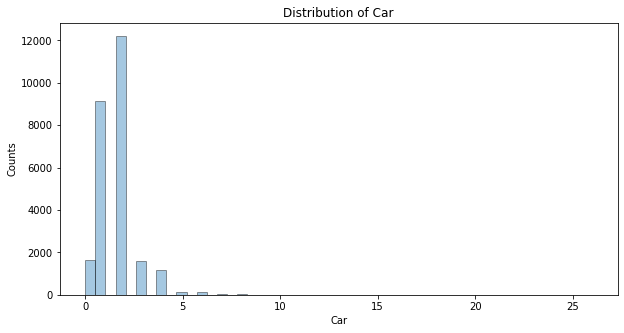

In [20]:
plt.figure(figsize=(10,5))
sns.distplot(df[df['Car'].notnull()].Car, hist=True, kde=False, hist_kws={'edgecolor':'black'})
plt.ylabel('Counts')
plt.title('Distribution of Car')

In [21]:
coef,p_val = stats.pearsonr(df[df['Car'].notnull()]['Car'],df[df['Car'].notnull()]['Rooms'])
print('The correlation coefficient between Car and Rooms:', coef)

The correlation coefficient between Car and Rooms: 0.3938778382971099


The distribution of **Car** is also simple. Most of the houses have one or two spots for cars. Since **Car** is a similar feature to **Bathroom**, the same steps used for replacing missing values in **Bathroom** are followed.

In [22]:
car_low = df[df['Rooms2']=='low'].Car.median()
car_medium = df[df['Rooms2']=='medium'].Car.median()
car_high = df[df['Rooms2']=='high'].Car.median()

In [23]:
df.loc[df['Rooms2']=='low', 'Car'] = df.loc[df['Rooms2']=='low', 'Car'].fillna(car_low)
df.loc[df['Rooms2']=='medium', 'Car'] = df.loc[df['Rooms2']=='medium', 'Car'].fillna(car_medium)
df.loc[df['Rooms2']=='high', 'Car'] = df.loc[df['Rooms2']=='high', 'Car'].fillna(car_high)

### Landsize, BuildingArea, and YearBuilt

**Landsize**, **BuildingArea**, and **YearBuilt** have too many missing values to be replaced. The correlations of these features with **Price** are not significantly strong compared to the sizes of the missing values in these features. Therefore, these features are dropped out of the data. 

In [24]:
coef1,p_val1 = stats.pearsonr(df[df['Landsize'].notnull()]['Landsize'],df[df['Landsize'].notnull()]['Rooms'])
coef2,p_val2 = stats.pearsonr(df[df['BuildingArea'].notnull()]['BuildingArea'],df[df['BuildingArea'].notnull()]['Rooms'])
print('The correlation coefficient between Landsize and Rooms:', coef1)
print('The correlation coefficient between BuildingArea and Rooms:', coef2)

The correlation coefficient between Landsize and Rooms: 0.0374021491134864
The correlation coefficient between BuildingArea and Rooms: 0.15622884432704484


In [25]:
df.drop(['Landsize','BuildingArea','YearBuilt'], axis=1, inplace=True)

### Latitude and Longitude

**Latitude** and **Longitude** can be used to identify the locations of houses. It is well known that location is one of the factors to affect the housing price.

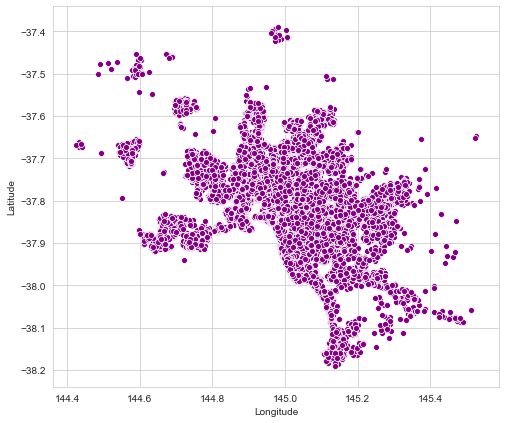

In [26]:
sns.set_style('whitegrid')
plt.figure(figsize=(8,7))
sns.scatterplot('Longitude', 'Latitude', data=df, color='purple')

Using **gmplot** in python, the geographical distribution of houses with density can be displayed as well.

In [27]:
from IPython.display import Image

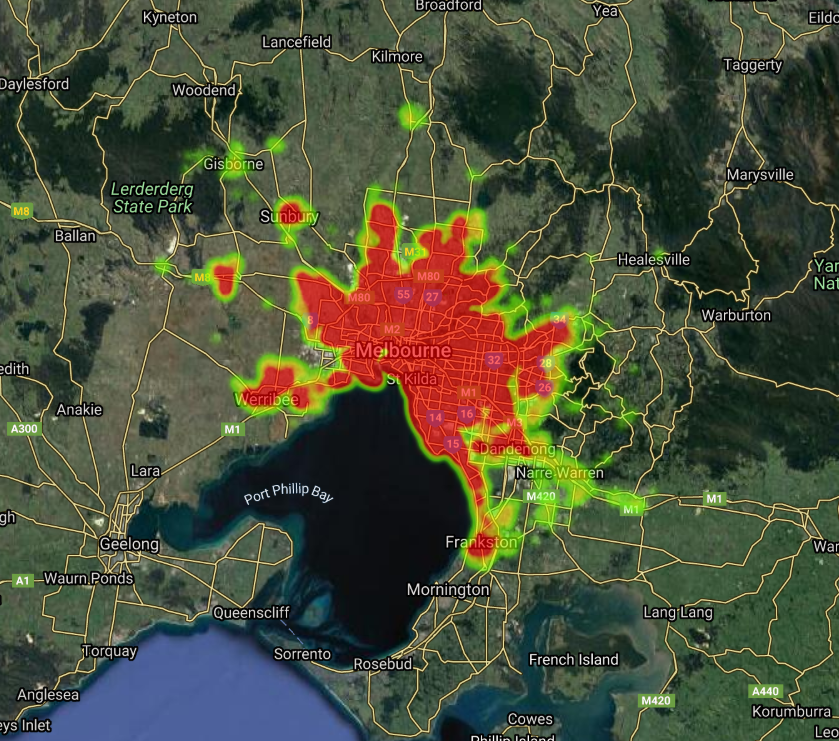

In [28]:
# image created by using gmplot
Image("C:/Users/hannah/Dropbox/Github_Desktop/housing_prices/melbourne_housing.png")

The color of the map represents the density of houses. However, this map does not deliver any information about the housing prices. The 3-D map can be used to show the relationship of the location of a house with its price.

In [29]:
import plotly.express as px
px.scatter_3d(df, x='Longitude', y='Latitude', z='Price', color='Price')

The 3-D plot above shows that the housing prices in the metropolitan areas vary a lot. The houses with high prices are concentrated in the Southern Metropolitan area. 

The problem with using **Latitude** and **Longitude** is that these features have too many missing values. The number of the missing values is 7,976. Due to the nature of these features, replacing the missing values is not ideal. 

Instead, we have several features related to the spatial locations of houses such as **Suburb**, **Address**, and **Regionname**. These features do not have missing values. Therefore, instead of replacing the missing values in **Latitude** and **Longitude** or dropping the entries with missing values in the features, I drop the features and use **Regionname** as a feature indicating locations.

In [30]:
df.drop(['Longitude','Latitude'], axis=1, inplace=True)

### Price and the Rest of the Features with Missing Values

**Price** has 7,610 missing values. Since this is the target, it is better to remove the rows with missing values in Price in order to maintain the accuracy of the analysis.

In [31]:
df.dropna(subset=['Price'], axis=0, inplace=True)

Regarding the rest of the features, the observations with missing values are dropped.

In [32]:
df.dropna(axis=0, inplace=True)

## Unnecessary Features

Including too many features unnecessary for the analysis can cause the over-fitting problem. Therefore, I drop some features which are not significant for the analysis.

In [33]:
df.drop(['Suburb','Address','Postcode','Propertycount','SellerG','CouncilArea', 'Method', 'Date','Rooms2'], axis=1, inplace=True)

## Outliers

Outliers are the observations that are distant from the remaining data. Since the outliers are considered outside of the overall pattern of the data, training a machine learning model including the outliers can lead to inaccurate predictions of the model.

There are several methods to detect outliers in the data analysis. Among the several techniques, what I employ in this analysis is the **Interquartile Range(IQR)** method. This technique finds data points that fall outside of 1.5 times of an interquartile range above the 3rd quartile(Q3) and below the 1st quartile(Q1), and drops those entries from the analysis.

Let's see the summary statistics for numerical features and the target.

In [34]:
df.describe()

,Rooms,Distance,Bathroom,Car,Price
count,27244.000000,27244.000000,27244.000000,27244.000000,2.724400e+04
mean,2.992365,11.280634,1.593745,1.686206,1.050210e+06
std,0.954810,6.787580,0.658678,0.896476,6.414923e+05
min,1.000000,0.000000,0.000000,0.000000,8.500000e+04
25%,2.000000,6.400000,1.000000,1.000000,6.350000e+05
50%,3.000000,10.500000,2.000000,2.000000,8.700000e+05
75%,4.000000,14.000000,2.000000,2.000000,1.295000e+06
max,16.000000,48.100000,9.000000,18.000000,1.120000e+07


In order to work on this efficiently, let's create a function to draw a distribution and a function to remove outliers using the IQR method.

In [35]:
def box_dist_plot(Feature):
    f, (ax_box, ax_dist) = plt.subplots(2, figsize=(10,6), sharex=True, gridspec_kw={"height_ratios": (.15, .85)})
    sns.boxplot(Feature, data=df, color='blue', ax=ax_box)
    sns.distplot(df[Feature],hist=True, kde=False, color='blue', ax=ax_dist)
    ax_dist.set_ylabel('Counts')
    ax_box.set_xlabel('')
    Q1 = df[Feature].quantile(0.25)
    Q3 = df[Feature].quantile(0.75)
    IQR = Q3-Q1
    Lower_Whisker = Q1 - 1.5*IQR
    Upper_Whisker = Q3 + 1.5*IQR
    print('Lower Whisker:',Lower_Whisker, 'Upper Whisker:',Upper_Whisker)

In [36]:
# OUtliear Remover Function
def OutlierRemover(Feature):
    global df
    Q1 = df[Feature].quantile(0.25)
    Q3 = df[Feature].quantile(0.75)
    IQR = Q3-Q1
    Lower_Whisker = Q1 - 1.5*IQR
    Upper_Whisker = Q3 + 1.5*IQR
    df = df[(df[Feature]>Lower_Whisker)&(df[Feature]<Upper_Whisker)]

### Price

Lower Whisker: -355000.0 Upper Whisker: 2285000.0


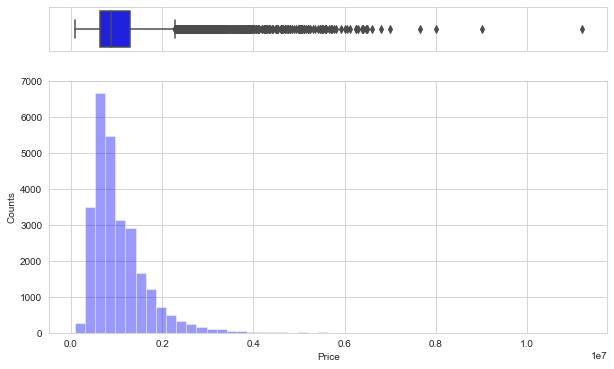

In [37]:
box_dist_plot('Price')

The data point for 1.5 times of the IQR above the Q3 (Upper Whisker) is 2285000 and the data point for 1.5 times of the IQR below the Q1 (Lower Whisker) is -355000.

In [38]:
OutlierRemover('Price')

### Rooms

Lower Whisker: 0.5 Upper Whisker: 4.5


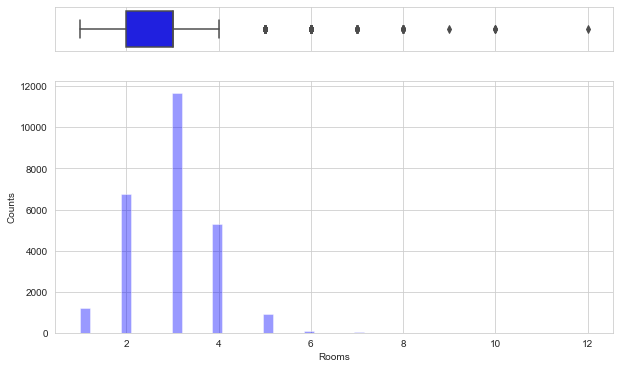

In [39]:
box_dist_plot('Rooms')

The upper whisker of Rooms is 4.5 and the lower whisker is 0.5.

In [40]:
OutlierRemover('Rooms')

### Distance

Lower Whisker: -4.999999999999998 Upper Whisker: 25.4


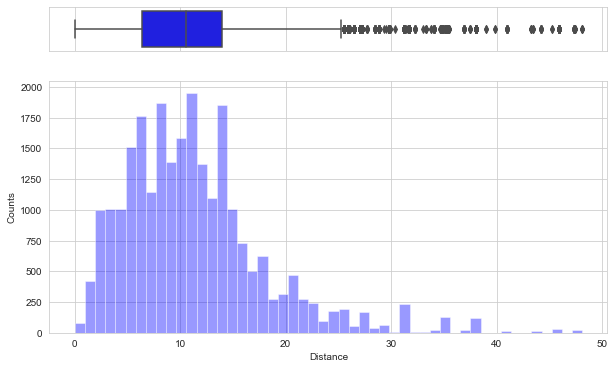

In [41]:
box_dist_plot('Distance')

The upper whisker is 25.4 kilometers and the lower whisker is -5 kilometers.

In [42]:
OutlierRemover('Distance')

### Bathroom

Lower Whisker: -0.5 Upper Whisker: 3.5


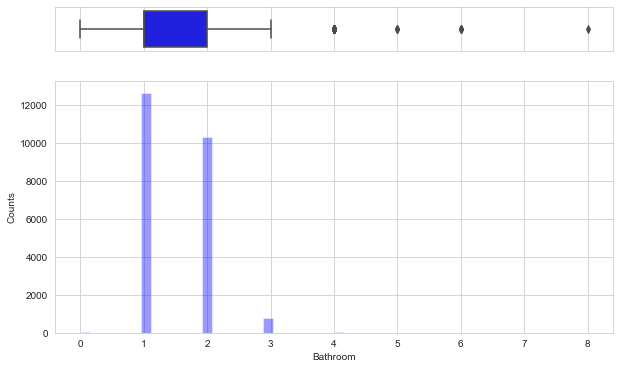

In [43]:
box_dist_plot('Bathroom')

The upper whisker is 3.5 and the lower whisker is -0.5.

In [44]:
OutlierRemover('Bathroom')

### Car

Lower Whisker: -0.5 Upper Whisker: 3.5


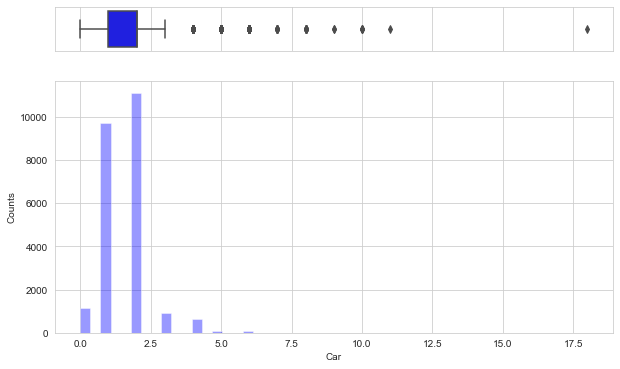

In [45]:
box_dist_plot('Car')

The upper whisker is 3.5 and the lower whisker is -0.5.

In [46]:
OutlierRemover('Car')

# Exploratory Data Analysis

Let's go over the initial investigations for the relationships of the features with Price. 

The numerical features included in the analysis are **Rooms, Bathroom, Car**, and **Distance**. The categorical features are **Regionname** and **Type**.

# Numerical Features

What we can expect from these features is that **Room, Bathroom**, and **Car** possibly have the positive relationships with **Price**, and that **Distance** has the negative relationship with **Price**. 

Generally, the numbers of rooms, bathrooms, and car spots are considered factors that increase the housing prices. Therefore, we can expect the positive relationships of those features with Price. On the other hand, Distance is expected to be negatively correlated to Price. 

One of the factors to affect the housing price is how close to the **central business district(CBD)** the house is. As the proximity to the CBD, the housing prices tends to increase. Therefore, **Distance** possibly has a negative relationship with Price.

The best way to see the relationships between numerical features and the target at a glance is to draw scatter plots. Let's see the regular scatter plots to show the relationships of the numerical features with Price.

Text(0, 0.5, '')

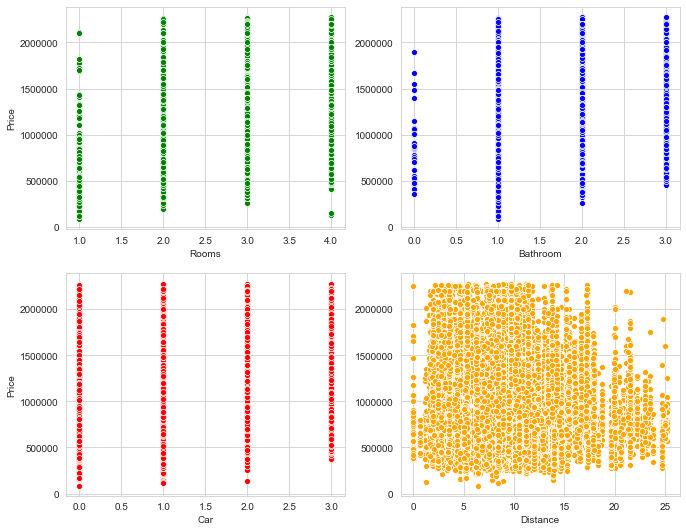

In [47]:
f,ax = plt.subplots(2,2,figsize=(11,9))

sns.scatterplot('Rooms', 'Price', data=df, color='g', ax=ax[0,0])
sns.scatterplot('Bathroom', 'Price', data=df, color='b', ax=ax[0,1])
sns.scatterplot('Car', 'Price', data=df, color='r', ax=ax[1,0])
sns.scatterplot('Distance', 'Price', data=df, color='orange', ax=ax[1,1])

ax[0,1].set_ylabel('')
ax[1,1].set_ylabel('')

In the above plots, it's not easy to see and understand the relationships between the features and the target. When we have too many data points compared to the variances of the respective features, there are many overlapped data points in the graphs so we can hardly see the relationships. 

The alternative way for this case is to use hexbin plots. A hexbin plot splits areas into several hexbins in the graph, and the color of each hexbin denotes the number of data points. As the color of a hexbin gets darker, there are more data points in the hexbin.

In [48]:
import matplotlib.image as mpimg

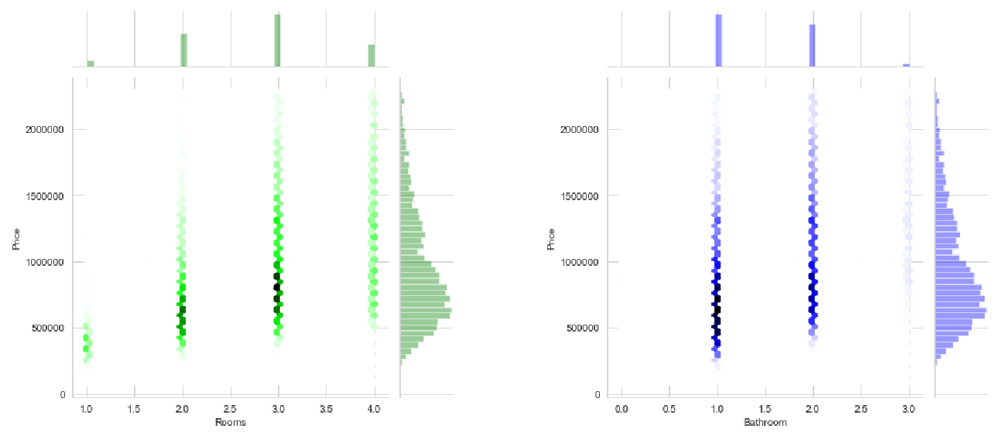

In [49]:
JG1 = sns.jointplot('Rooms', 'Price', data=df, kind='hex', color='g')
JG2 = sns.jointplot('Bathroom', 'Price', data=df, kind='hex', color='b')

JG1.savefig('JG1.png')
plt.close(JG1.fig)

JG2.savefig('JG2.png')
plt.close(JG2.fig)

f, ax = plt.subplots(1,2,figsize=(20, 8))

ax[0].imshow(mpimg.imread('JG1.png'))
ax[1].imshow(mpimg.imread('JG2.png'))

[ax.set_axis_off() for ax in ax.ravel()]
plt.tight_layout()

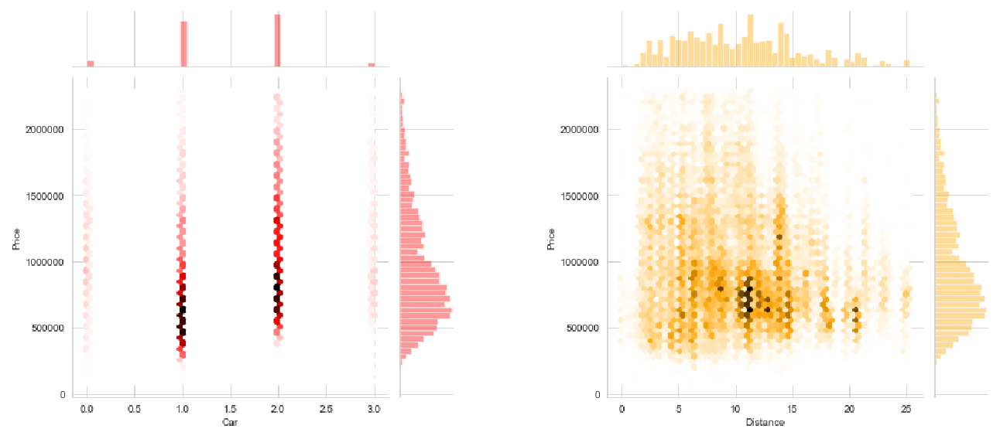

In [50]:
JG3 = sns.jointplot('Car', 'Price', data=df, kind='hex', color='r')
JG4 = sns.jointplot('Distance', 'Price', data=df, kind='hex', color='orange') 

JG3.savefig('JG3.png')
plt.close(JG3.fig)

JG4.savefig('JG4.png')
plt.close(JG4.fig)

f, ax = plt.subplots(1, 2, figsize=(20, 8))

ax[0].imshow(mpimg.imread('JG3.png'))
ax[1].imshow(mpimg.imread('JG4.png'))

[ax.set_axis_off() for ax in ax.ravel()]
plt.tight_layout()

The plots above clearly show the positive relationships of **Rooms, Bathroom, Car** with **Price** and the negative relationship of **Distance** with **Price**. 

To check those relationships in numbers, let's check the correlation matrix among the numerical features and Price.

(5, 0)

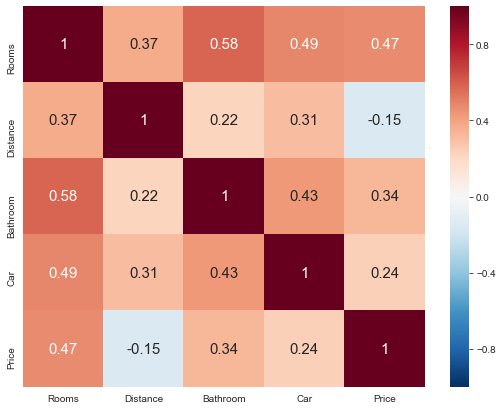

In [51]:
plt.figure(figsize=(9,7))
ax = sns.heatmap(df.corr(), cmap='RdBu_r', annot=True, annot_kws={"size": 15}, vmin=-1, vmax=1)
ax.set_ylim(5,0)

The correlation coefficients of **Rooms, Bathroom, Car**, and **Distance** are 0.47, 0.34, 0.24, and -0.15, respectively. 

As we saw in the hexbin plots, **Rooms, Bathroom, and Car** have positive relationships with **Price**, and **Distance** has a negative relationship. 

# Categorical Features

The categorical features are **Regionname** and **Type**. By drawing the map using Latitude and Longitude, We already checked that some specific regions in the metropolitan areas have higher housing prices than others, which means that **Regionname** can affect the housing price. The types of houses are also known as a factor to affect the housing prices.

## Regionname

Regionname has 7 unique values: Northern Metropolitan, Southern Metropolitan, Western Metropolitan, Eastern Metropolitan, South-Eastern Metropolitan, Northern Victoria, and Eastern Victoria. These region names are the **Electoral Regions of Victoria**. Basically, these regions are divided into eight regions. In our data, there's no housing data located in the Western Victoria. 

Let's see the box plot between Regionname and Price.

Northern Metropolitan         7178
Southern Metropolitan         7068
Western Metropolitan          5083
Eastern Metropolitan          2799
South-Eastern Metropolitan     788
Northern Victoria               28
Eastern Victoria                 1
Name: Regionname, dtype: int64

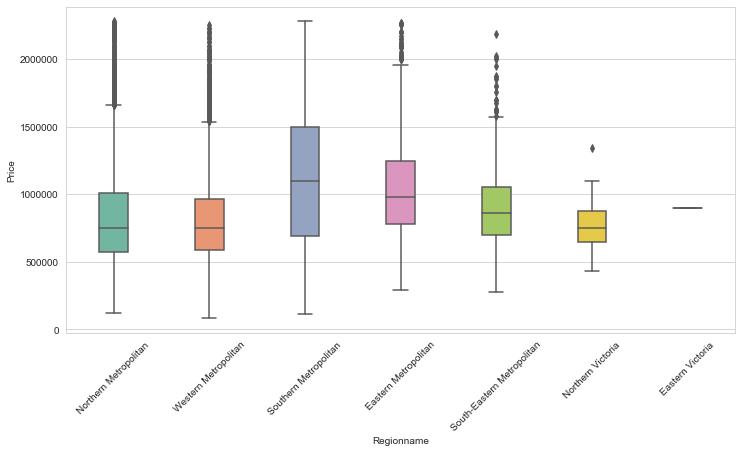

In [52]:
plt.figure(figsize=(12,6))
sns.boxplot('Regionname', 'Price', data=df, width=0.3, palette="Set2")
plt.xticks(rotation=45)

df['Regionname'].value_counts()

Most of the houses are located in the metropolitan area. 

Northern and Southern Metropolitan areas have the most houses in the data. In the box plot, it appears that the housing prices of Southern Metropolitan are the highest on average and the housing prices of Northern Metropolitan are the lowest. 

In the raw data before the removal of outliers, the most expensive house is also located in the Southern Metropolitan. The box plot indicates that in general the houses in Southern and Eastern Metropolitan areas tend to be more expensive than the houses in Northern and Western Metropolitan areas.

In order to use this feature in the analysis, I create dummies for this feature and merge them into the data set.

In [53]:
regionname = pd.get_dummies(df['Regionname'],drop_first=True)

In [54]:
df = pd.merge(df, regionname, left_index=True, right_index=True)
df.drop('Regionname', axis=1, inplace=True)

## Type

It is generally known that the type of house is a factor to affect its price. Even though there are many different types of houses in reality, our data set divides the types into three categories:

h - house,cottage,villa, semi,terrace;
u - unit, duplex;
t - townhouse;

h    14351
u     5817
t     2777
Name: Type, dtype: int64

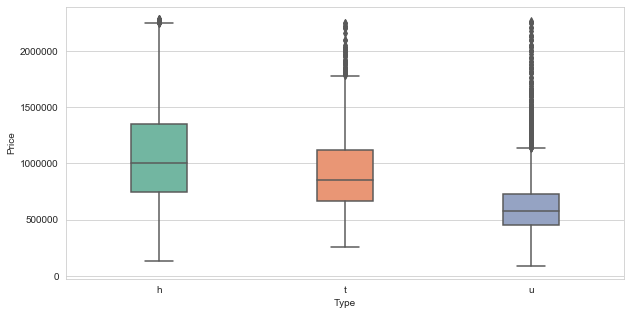

In [55]:
plt.figure(figsize=(10,5))
sns.boxplot('Type', 'Price', data=df, width=0.3, palette="Set2")

df['Type'].value_counts()

About 60% of the observations is the type h, and about 25% is the type u. In the box plot, the type h appears to have the largest variance. The most expensive and the cheapest houses belong to the type h. Based on the median, the type h seems to be the most expensive among the three categories, and the type u seems to be the cheapest.

Let's create dummies for Type as well and combine them into the data set.

In [56]:
house_type = pd.get_dummies(df['Type'], drop_first=True)

In [57]:
df = pd.merge(df,house_type, left_index=True, right_index=True)
df.drop('Type', axis=1, inplace=True)

# Predictive Modeling

From the EDA, we gained some insight of how each feature is associated with the target, **Price**. In this section, I build several models to predict the housing prices in Melbourne. The regression models used in this analysis are **Linear Regression, Ridge Regression, K-Nearest Neighbors**, and **Decision Tree**.

In [58]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_validate
from sklearn import metrics

In [59]:
X=df.drop('Price', axis=1)
y=df['Price']

train_X, test_X, train_y, test_y = train_test_split(X,y,test_size=0.3, random_state=0)

The testing data is set to be 30% out of the entire data. In order to measure the performance of predictions for each model. 

I use two performance metrics. 

The first one is the **coefficient of determination**, which is usually expressed as **R²**. The coefficient of determination is the ratio of the variance of a target explained or predicted by a model over the total variance of the target. It ranges from 0 to 1, and as the value is closer to 1, the model explains or predicts the variance of the target better.

The second metric is the **Mean Squared Error(MSE)**. The MSE is the average of the squared difference between the estimated or predicted values and the actual values of a target. This is always greater than zero. A lower value of the MSE indicates higher accuracy of predictions of a model. In this analysis, I use the square root of this metric(RMSE).

Let's create a function to calculate R² and RMSE, and a function to compare the distributions of actual values and predicted values for each model.

In [60]:
def Predictive_Model(estimator):
    estimator.fit(train_X, train_y)
    prediction = estimator.predict(test_X)
    print('R_squared:', metrics.r2_score(test_y, prediction))
    print('Square Root of MSE:',np.sqrt(metrics.mean_squared_error(test_y, prediction)))
    plt.figure(figsize=(10,5))
    sns.distplot(test_y, hist=True, kde=False)
    sns.distplot(prediction, hist=True, kde=False)
    plt.legend(labels=['Actual Values of Price', 'Predicted Values of Price'])
    plt.xlim(0,)

In [61]:
def FeatureBar(model_Features, Title, yLabel):
    plt.figure(figsize=(10,5))
    plt.bar(df.columns[df.columns!='Price'].values, model_Features)
    plt.xticks(rotation=45)
    plt.title(Title)
    plt.ylabel(yLabel)

## Basic Predictions

### Linear Regression

In [62]:
from sklearn.linear_model import LinearRegression

R_squared: 0.6145909339366225
Square Root of MSE: 264465.21992510103


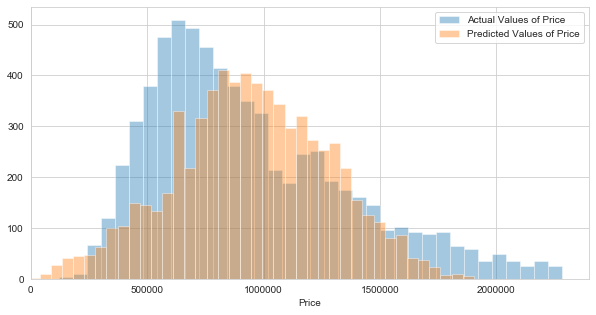

In [63]:
lr = LinearRegression()
Predictive_Model(lr)

The R² of the linear regression is 0.6146, which means that about 60% of the variance of the housing prices in the data can be predicted by the model. The RMSE is 264,465. This means that for all the predictions for the testing set, the average difference for each prediction is 264,465.

The above histograms display how the distributions of the actual prices and the predicted prices are different. The bins which have the most houses in the actual price are between 550,000 and 700,000, whereas the bins between 750,000 and 950,000 have the most houses for the predicted price.

Each coefficient of the linear regression represents the magnitude of the impact of the feature on the target. The bar chart below shows the magnitudes for each coefficient in the model.

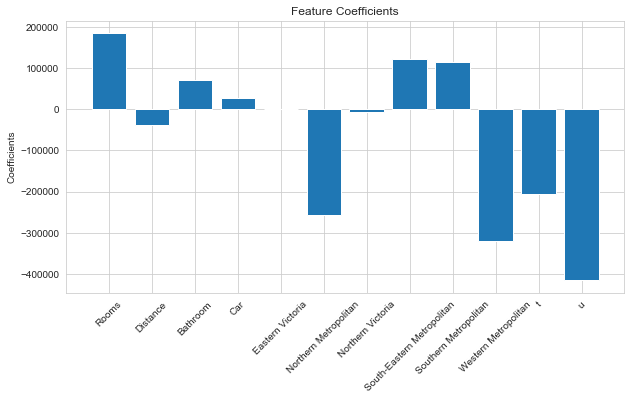

In [64]:
FeatureBar(lr.coef_, 'Feature Coefficients', 'Coefficients')

In [65]:
lr.coef_

array([ 1.84486419e+05, -3.83630043e+04,  7.03134611e+04,  2.65798965e+04,
       -1.74622983e-10, -2.57838436e+05, -7.84193065e+03,  1.23191699e+05,
        1.13614860e+05, -3.20164997e+05, -2.05372014e+05, -4.15422202e+05])

The coefficients for **Rooms, Bathroom,** and **Car** in the model are 184486, 70313, and 26580, respectively. This means that one unit increases in **Rooms, Bathroom,** and **Car** spot raise the housing price by \\$184,486, \\$70,313, and \\$26,580, respectively. The coefficient of Distance is -38363, which means that one kilometer increase in the distance to the CBD decreases the price by \\$38,363.

As for **Regionname**, the coefficient for South-Eastern Metropolitan is 123192. Due to the multi-collinearity issue, the dummy for Eastern Metropolitan is dropped. Therefore, the meaning of the coefficient is that the shift from Eastern Metropolitan to South-Eastern Metropolitan has the impact of the price increase by \\$123,192.

When it comes to Type, h is dropped due to collinearity. The coefficient for u is -415422. This means that the change of the house type from u to h has the impact to increase price by \\$415,422.

### Ridge Regression

In [66]:
from sklearn.linear_model import Ridge

R_squared: 0.6132626365323606
Square Root of MSE: 264920.5624961373


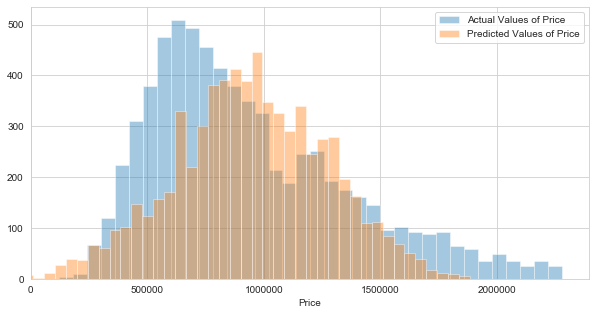

In [67]:
rr = Ridge(alpha=100)
Predictive_Model(rr)

Like linear regression, ridge regression basically uses the algorithm to minimize the cost function which is the sum of the squares of the difference between the actual target values and the predicted values. 

The difference between these two models is that ridge regression adds a penalty term to this basic cost function. The penalty term is the product of the regularization parameter and the sum of the square of the coefficients. The purpose of adding the penalty term in the ridge regression is to prevent the model from over-fitting the training set and to gain better predictions for the testing set. As a bigger number is put to this regularization parameter, there will be more penalty in large values of the coefficients. Therefore, the model will operate in a way to reduce the magnitude of the coefficients.

The result above is obtained with the regularization parameter(alpha) equal to 100. The R² of this model is 0.6133, and the RMSE is 264,920. The performance of the model with alpha equal to 100 appears to be a little bit worse than the linear regression.

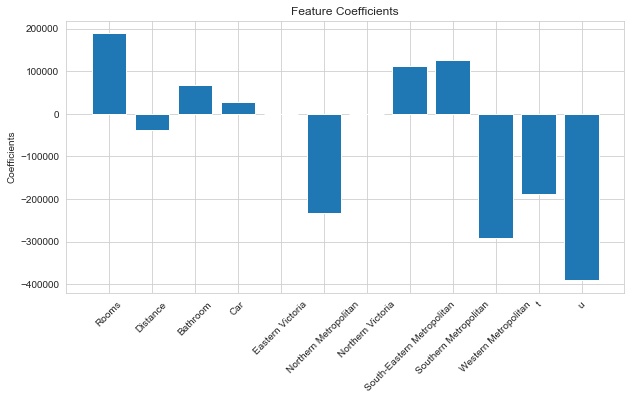

In [68]:
FeatureBar(rr.coef_, 'Feature Coefficients', 'Coefficients')

The bar chart for the coefficients from the ridge regression shows that the magnitude of the coefficients in the ridge regression is smaller than those in the linear regression by and large.

### K-Nearest Neighbors

In [69]:
from sklearn.neighbors import KNeighborsRegressor

R_squared: 0.7053210501091607
Square Root of MSE: 231250.2224575754


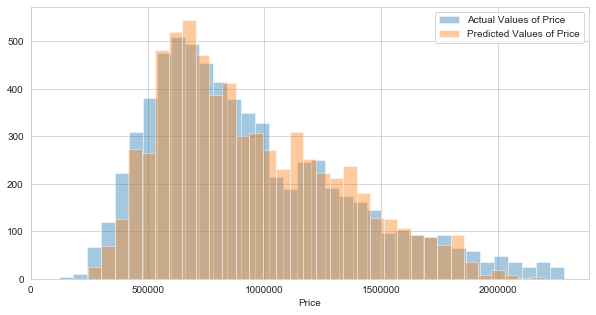

In [70]:
knn = KNeighborsRegressor(n_neighbors=5)
Predictive_Model(knn)

The KNN model makes predictions for the target using the target values of K-nearest neighbors. The result above is obtained with the number of the neighbors equal to 5. The R² of this model is 0.7053, and the RMSE is 231,250.

Compared to the distributions of the predicted values from linear and ridge regressions, the KNN model seems to predict the housing price better.

### Decision Tree

In [71]:
from sklearn.tree import DecisionTreeRegressor

R_squared: 0.6919890752208913
Square Root of MSE: 236423.5111294015


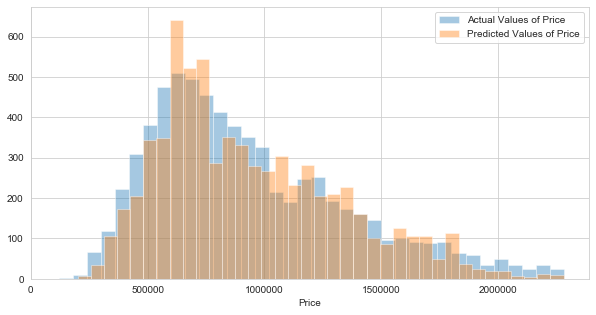

In [72]:
dt = DecisionTreeRegressor(max_depth=15, random_state=0)
Predictive_Model(dt)

In the decision tree model, the max depth is one of the factors to prevent the over-fitting issue of the model. As the depth of the tree is greater, the tree has more branches and becomes bigger. As the tree has more branches, the prediction for the training set can be more accurate. 

However, there is a bigger variance in predicting the testing set. Therefore, setting the max depth optimally is important in order to avoid the over-fitting issue. In the example above, max depth is set to 15. The R² of this model is 0.6920, and the RMSE is 236,424.

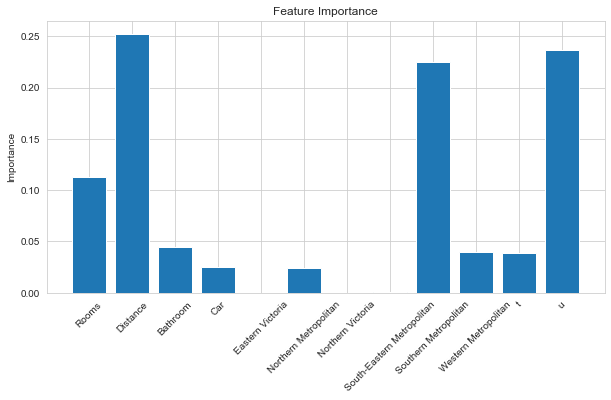

In [73]:
FeatureBar(dt.feature_importances_, 'Feature Importance', 'Importance')

The decision tree does not create any coefficients for the features used in the prediction. However, by calculating how much the mean squared error decreases by selecting a feature for splits, we can measure the importance of each feature in the decision tree model. In our data set, Distance appears to be the most important in the predictions and the dummies for Southern Metropolitan and u type of houses are also important in the predictions compared to other features.

### Performance Summary

In [74]:
regressor = ['Linear Regression', 'Ridge Regression', 'KNN', 'Decision Tree']
models = [LinearRegression(), Ridge(alpha=100), KNeighborsRegressor(n_neighbors=5), DecisionTreeRegressor(max_depth=15, random_state=0)]
R_squared = []
RMSE = []
for m in models:
    m.fit(train_X, train_y)
    prediction_m = m.predict(test_X)
    r2 = metrics.r2_score(test_y, prediction_m)
    rmse = np.sqrt(metrics.mean_squared_error(test_y, prediction_m))
    R_squared.append(r2)
    RMSE.append(rmse)
basic_result = pd.DataFrame({'R squared':R_squared,'RMSE':RMSE}, index=regressor)
basic_result

,R squared,RMSE
Linear Regression,0.614591,264465.219925
Ridge Regression,0.613263,264920.562496
KNN,0.705321,231250.222458
Decision Tree,0.691989,236423.511129


In the table above, the KNN seems to be the optimal model to predict the housing prices in Melbourne. However, it is too early to make a conclusion since there are more things to be considered. The first is that we use only one specific selection of a training and testing sets, and the second is that for each model we chose one specific value for each hyper parameter. Since the values were chosen arbitrarily for the hyper parameters, the results can vary according to what values we choose for those parameters.

To get a robust result covering these issues, we need to go through the cross validation and grid search process as well.

## Cross Validation and Grid Search

### Linear Regression

In [75]:
scoring={'R_squared':'r2', 'Square Root of MSE': 'neg_mean_squared_error'}

In [76]:
def CrossVal(estimator):
    scores = cross_validate(estimator, X, y, cv=10, scoring=scoring)
    r2 = scores['test_R_squared'].mean()
    mse = abs(scores['test_Square Root of MSE'].mean())
    print('R_squared:', r2)
    print('Square Root of MSE:', np.sqrt(mse))

In [77]:
CrossVal(LinearRegression())

R_squared: 0.5918115585795747
Square Root of MSE: 269131.0885647736


Since the linear regression does not have any hyper parameter in our analysis, only CV is performed here. The number of the folds in the CV is set to be 10. The average of the R² is 0.5918 and the RMSE is 269131.

### Ridge Regression

The regularization parameter in the ridge regression is expressed as alpha in sklearn. Since GridSearchCV in sklearn includes the process of the Cross Validation, the process of performing cross_validate is omitted. The set of the grid for alpha is set to be [0.01, 0.1, 1, 10, 100, 1000, 10000] here.

In [78]:
from sklearn.model_selection import GridSearchCV

In [79]:
def GridSearch(estimator, Features, Target, param_grid):
    for key, value in scoring.items():
        grid = GridSearchCV(estimator, param_grid, cv=10, scoring=value)
        grid.fit(Features,Target)
        print(key)
        print('The Best Parameter:', grid.best_params_)
        if grid.best_score_ > 0:
            print('The Score:', grid.best_score_)
        else:
            print('The Score:', np.sqrt(abs(grid.best_score_)))
        print()

In [80]:
param_grid = {'alpha':[0.01, 0.1, 1, 10, 100, 1000, 10000]}

GridSearch(Ridge(), X, y, param_grid)

R_squared
The Best Parameter: {'alpha': 10}
The Score: 0.5918404945235951

Square Root of MSE
The Best Parameter: {'alpha': 10}
The Score: 269125.20208461734



The result shows that the best value of the alpha is 10. The R² and the RMSE are 0.5918 and 269125, respectively, under alpha = 10.

### K-Nearest Neighbors

The hyper parameter for KNN we use in this analysis is the number of the nearest neighbors(n_neighbors). The range for the grid is the integers from 5 to 25.

In [81]:
param_grid = dict(n_neighbors=np.arange(5,26))

GridSearch(KNeighborsRegressor(), X, y, param_grid)

R_squared
The Best Parameter: {'n_neighbors': 16}
The Score: 0.6973921821195777

Square Root of MSE
The Best Parameter: {'n_neighbors': 16}
The Score: 232900.0204190322



The optimal number of n_neighbors is 16. The R² is 0.6974 and the RMSE is 232900. We can see how 16 is the optimal value for n_neighbors in our analysis via looking at the Validation Curve.

In [82]:
from sklearn.model_selection import validation_curve

In [83]:
def ValidationCurve(estimator, Features, Target, param_name, Name_of_HyperParameter, param_range):
    
    train_score, test_score = validation_curve(estimator, Features, Target, param_name, param_range,cv=10,scoring='r2')
    Rsqaured_train = train_score.mean(axis=1)
    Rsquared_test= test_score.mean(axis=1)
    
    plt.figure(figsize=(10,5))
    plt.plot(param_range, Rsqaured_train, color='r', linestyle='-', marker='o', label='Training Set')
    plt.plot(param_range, Rsquared_test, color='b', linestyle='-', marker='x', label='Testing Set')
    plt.legend(labels=['Training Set', 'Testing Set'])
    plt.xlabel(Name_of_HyperParameter)
    plt.ylabel('R_squared')

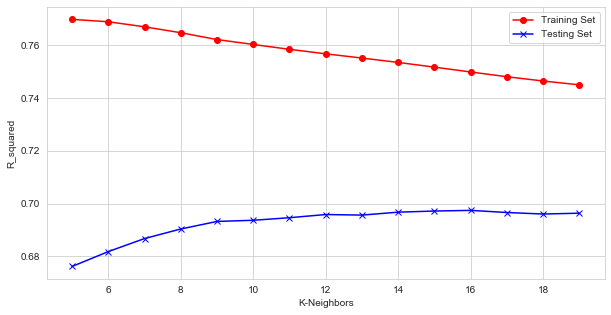

In [84]:
ValidationCurve(KNeighborsRegressor(), X, y, 'n_neighbors', 'K-Neighbors',np.arange(5,20))

As the number of K-Neighbors decreases, the R² for the training set tends to keep increasing. The R² for the testing set begins to increase as the number of K-Neighbors decreases. However, when we use a low value for n_neighbors, the R² for the testing set keeps falling since the model is over-fitted to the training set. The optimal level for the n_neighbors is where the testing score switches from increasing to decreasing. In the case above, 16 is the optimal level.

### Decision Tree

In the decision tree model, there can be several hyper parameters to be considered. In our analysis, only the max_depth is the option for the hyper parameter. The range of the max_depth to be checked is the integers from 2 to 14.

In [85]:
param_grid=dict(max_depth=np.arange(4,15))

GridSearch(DecisionTreeRegressor(random_state=0), X, y, param_grid)

R_squared
The Best Parameter: {'max_depth': 9}
The Score: 0.6844932569321078

Square Root of MSE
The Best Parameter: {'max_depth': 9}
The Score: 237680.2374774415



The result indicates that the optimal value for the max_depth is 9. The R² is 0.6845 and the RMSE is 237708 under max_depth=9. Let's draw the validation curve.

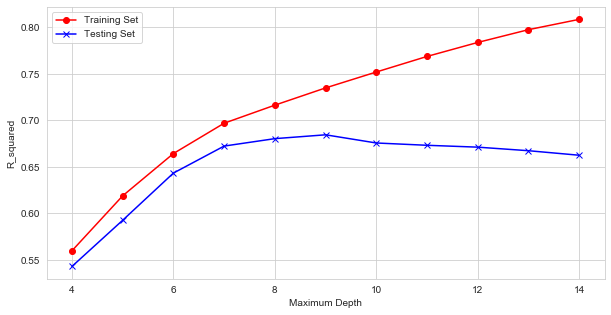

In [86]:
ValidationCurve(DecisionTreeRegressor(random_state=0), X, y, 'max_depth', 'Maximum Depth', np.arange(4,15))

As the number for the max_depth goes up, the training and testing scores increase in the beginning. However, when the max_number goes over 9, the testing scores keeps falling while the training scores keeps increasing. This shows that the model over-fits the training set when the max_number is greater than 9.

### Cross Validation Summary

The table and the graphs below shows the scores of the R² for each round of testing in CV. Since cv is set to be 10, we have 10 rounds of testings.

In [87]:
lr_scores = cross_validate(LinearRegression(), X, y, cv=10, scoring='r2')
rr_scores = cross_validate(Ridge(alpha=10), X, y, cv=10, scoring='r2')
knn_scores = cross_validate(KNeighborsRegressor(n_neighbors=16), X, y, cv=10, scoring='r2')
dt_scores = cross_validate(DecisionTreeRegressor(max_depth=9, random_state=0), X, y, cv=10, scoring='r2')

lr_test_score = lr_scores.get('test_score')
rr_test_score = rr_scores.get('test_score')
knn_test_score = knn_scores.get('test_score')
dt_test_score = dt_scores.get('test_score')

box= pd.DataFrame({'Linear Regression':lr_test_score, 'Ridge Regression':rr_test_score, 'K-Nearest Neighbors':knn_test_score, 'Decision Tree':dt_test_score})
box.index = box.index + 1
box.loc['Mean'] = box.mean()
box

,Linear Regression,Ridge Regression,K-Nearest Neighbors,Decision Tree
1,0.633088,0.632853,0.642226,0.643469
2,0.618220,0.618500,0.695198,0.682198
3,0.475365,0.476083,0.633174,0.617119
4,0.612866,0.612847,0.664604,0.643760
5,0.580284,0.580233,0.693852,0.676222
6,0.579387,0.579134,0.729156,0.700413
7,0.625552,0.625600,0.746432,0.721238
8,0.614225,0.614070,0.739146,0.736136
9,0.577580,0.577570,0.707545,0.694580
10,0.601549,0.601531,0.722657,0.729866


According to the result in the table, the best machine learning model in our analysis is the KNN since the mean of the scores for each round is the highest for KNN.

Text(0.5, 0, 'K-th Fold')

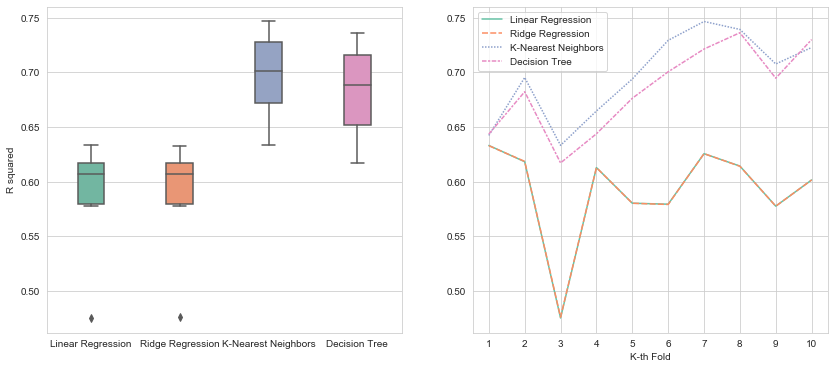

In [88]:
f,ax=plt.subplots(1,2, figsize=(14,6))

sns.boxplot(data=box.drop(box.tail(1).index), width=0.3, palette="Set2", ax=ax[0])
ax[0].set_ylabel('R squared')

sns.lineplot(data=box.drop(box.tail(1).index), palette="Set2", ax=ax[1])
ax[1].set_xticks(np.arange(1,11,1))
ax[1].set_xlabel('K-th Fold')

The box and line plots above show the distributions and the changes of the scores for each model. The decision tree model as well as KNN shows a good performance in our analysis. Linear and ridge regressions do not show a significant difference in their performance.

# Conclusion

The data used in this analysis is the Melbourne Housing Market in Kaggle data set. The features selected for the prediction of the housing price are Rooms, Bathroom, the number of the Car spots, the Distance to the Central Business District, Regionname, and the Type of the house. For each numerical feature, the data observations beyond 1.5 times of the interquartile range are excluded as outliers. The models used for the predictions are Linear Regressions, Ridge Regressions, K-Nearest Neighbors, and Decision Tree. The model showing the best performance for the prediction is K-Nearest Neighbors, and the optimal value for the number of neighbors is 16.